In [1]:
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
from torch.utils.data.dataset import Dataset
from torch.utils.data import DataLoader, random_split
import torchvision.utils as vutils
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from mpl_toolkits.axes_grid1 import ImageGrid
from IPython.display import HTML
from Model import Discriminator, Generator

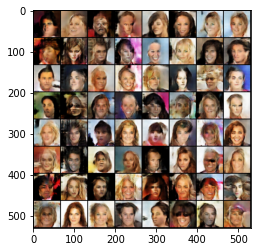

In [2]:
ngpu = 1
nz = 100

device = torch.device("cuda:0" if (
    torch.cuda.is_available() and ngpu > 0) else "cpu")
generator = Generator(ngpu).to(device)
generator.load_state_dict(torch.load('./best_model/lg0.4297_ld1.0624_iter3800.pth'))
generator.eval()

fixed_noise = torch.randn(64, nz, 1, 1, device=device)
fake = generator(fixed_noise).detach().cpu()
imgs = vutils.make_grid(fake, padding=2, normalize=True)
imgs = imgs.numpy()
imgs = np.transpose(imgs, (1, 2, 0))
imgs = Image.fromarray((imgs * 255).astype(np.uint8))
imgs.save('best.png')
plt.imshow(imgs)
plt.show()


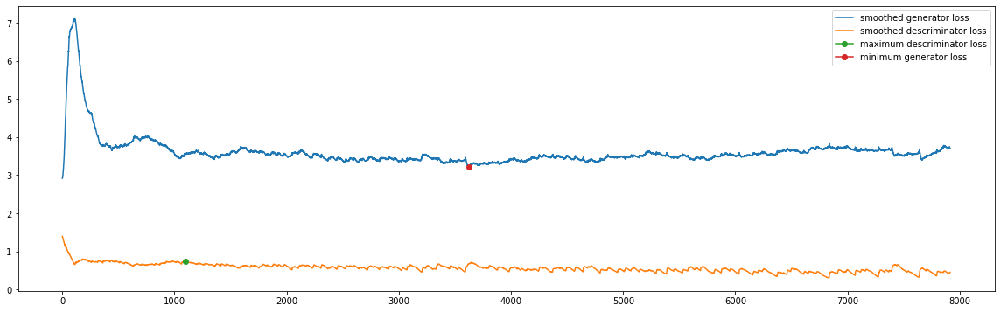

In [3]:
loss_g = np.load('loss_g.npy')
loss_d = np.load('loss_d.npy')
smooth_g = [loss_g[0]]
smooth_d = [loss_d[0]]

for i in range(1,loss_d.shape[0]):
    smooth_d.append(loss_d[i]*0.01+smooth_d[-1]*0.99)
    smooth_g.append(loss_g[i]*0.01+smooth_g[-1]*0.99)

arg_m = np.argmin(smooth_g[1000:])+1000
arg_M = np.argmax(smooth_d[1000:])+1000


plt.figure(figsize=(20,6))
plt.plot(smooth_g,label='smoothed generator loss')
plt.plot(smooth_d,label='smoothed descriminator loss')
plt.plot(arg_M,smooth_d[arg_M],marker='o',label='maximum descriminator loss')
plt.plot(arg_m,smooth_g[arg_m],marker='o',label='minimum generator loss')
plt.legend()
plt.show()

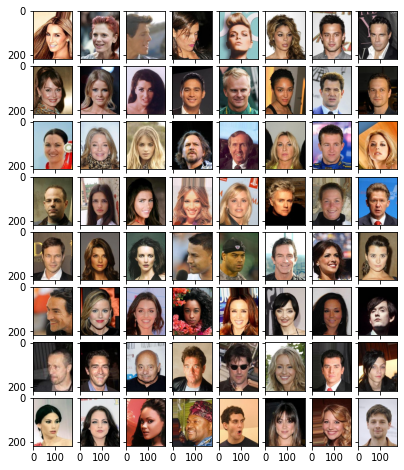

In [4]:

imgs = []
for i in range(8*8):
    imgs.append(Image.open(os.getcwd()+"/img_align_celeba/%06d.jpg"%(i+1)))


fig = plt.figure(figsize=(8., 8.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(8,8),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )

for ax, im in zip(grid, imgs):
    # Iterating over the grid returns the Axes.
    ax.imshow(im)

plt.show()

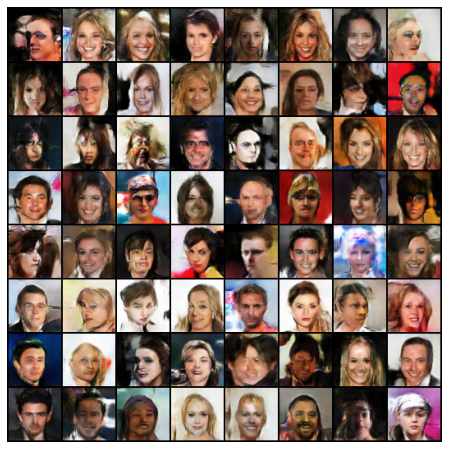

In [5]:
files = os.listdir('./generated')
files.sort()
img_list = []
for f in files: 
    img = Image.open('./generated/' + f).convert('RGB')
    img_list.append(img)

fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(i, animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())